In [53]:
%load_ext autoreload
%autoreload 2

from tifffile import imread

from caImageAnalysis import BrukerFish, VolumeFish
from caImageAnalysis.mesm import *
from caImageAnalysis.temporal import *
from caImageAnalysis.visualize import visualize_images

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Change the exp_folder to the path of the experiment

In [6]:
# Change this path to the experiment folder
exp_folder = r'/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818'

In [18]:
# Initialize the fish. 
# If custom 2P, use VolumeFish. If Bruker 2P, use BrukerFish.

# fish = VolumeFish(exp_folder)
fish = BrukerFish(exp_folder)
fish.data_paths

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


{'raw': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818/hindbrain-000'),
 'frametimes': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818/frametimes.txt'),
 'raw_image': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818/._ch2.tif'),
 'rotated': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818/raw_rotated.tif'),
 'opts': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818/opts.pkl'),
 'mesmerize': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818/mesmerize-batch'),
 'temporal': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818/temporal.h5'),
 'vol_temporal': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_10dpf_fed_glucose_500mM_5_20230818/vol_temporal.pkl'),
 'anatomy': PosixPath('/Volum

## Detrend dF/F

In [8]:
# Compute the dF/F signal for each component
df = compute_dff(fish)
df

/Users/minelarinel/caImageAnalysis/caImageAnalysis/utils.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/utils.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temporal_df['dff'][i] = dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/utils.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temporal_df['dff'][i] = dffs
/Users/minelarinel/

,plane,temporal,roi_indices,pulse_frames,dff
0,0,"[[-4.453364870984601, -4.453364870984601, -4.4...","[3, 4, 5, 7, 9, 10, 11, 13, 14, 16, 17, 18, 19...","[388, 779]","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,1,"[[-32.79498199117141, -32.79498199117141, -32....","[1, 2, 3, 5, 6, 7, 8, 10, 11, 15, 16, 17, 19, ...","[387, 779]","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,2,"[[-6.8591717826398835, -6.8591717826398835, -6...","[3, 5, 8, 9, 10, 11, 14, 16, 17, 18, 19, 20, 2...","[387, 779]","[[-0.2639954821903705, -0.2639954821903705, -0..."
3,3,"[[-29.31373768454148, -29.31373768454148, -29....","[0, 1, 2, 5, 7, 10, 11, 12, 15, 17, 18, 19, 20...","[387, 778]","[[-0.5123890479540817, -0.5123890479540817, -0..."
4,4,"[[-6.364192053214542, -6.364192053214542, -6.3...","[1, 3, 4, 5, 7, 10, 12, 13, 15, 17, 18, 20, 21...","[387, 778]","[[-0.04173954959157734, -0.04173954959157734, ..."


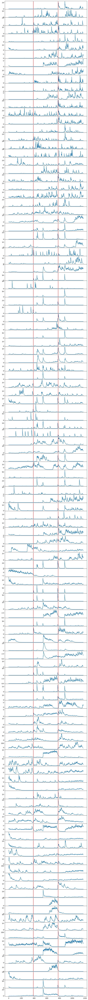

In [26]:
# Plot the individual dF/F traces per plane
plane = 0

plot_temporal(fish, plane, heatmap=False, key='dff')

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


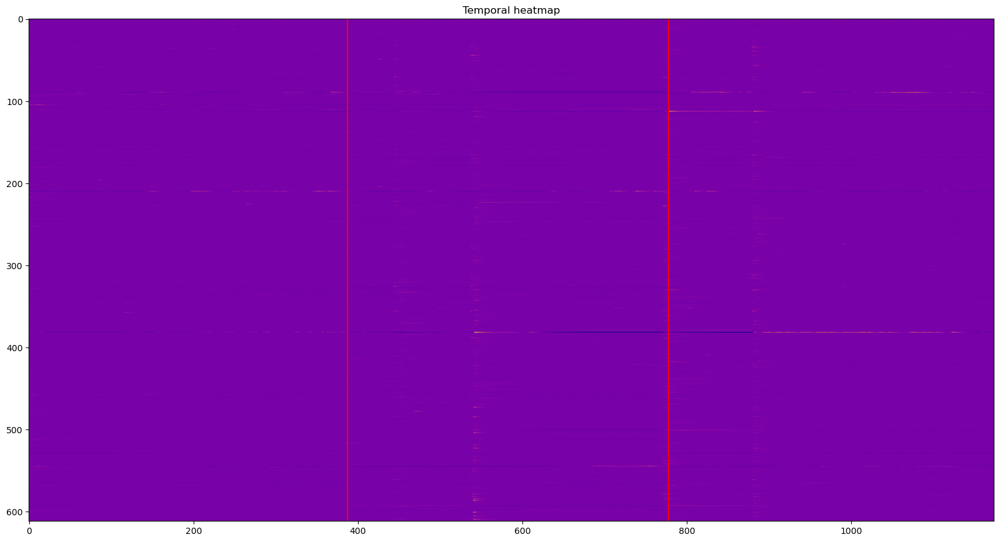

In [41]:
# Plot the individual dF/F traces of the entire volume as a heatmap
plot_temporal_volume(fish, key='dff')

### Normalize between 0 and 1

In [30]:
# Normalize each trace between 0 and 1
norm_df = normalize_dff(fish)
norm_df

/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['norm_dff'][i] = norm_dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.temporal_df['norm_dff'][i] = norm_dffs
/Users/minelarinel/caImageAnalysis/caImageAnalysis/temporal.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fish.tempora

,plane,temporal,roi_indices,pulse_frames,dff,norm_dff
0,0,"[[-4.453364870984601, -4.453364870984601, -4.4...","[3, 4, 5, 7, 9, 10, 11, 13, 14, 16, 17, 18, 19...","[388, 779]","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,1,"[[-32.79498199117141, -32.79498199117141, -32....","[1, 2, 3, 5, 6, 7, 8, 10, 11, 15, 16, 17, 19, ...","[387, 779]","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,2,"[[-6.8591717826398835, -6.8591717826398835, -6...","[3, 5, 8, 9, 10, 11, 14, 16, 17, 18, 19, 20, 2...","[387, 779]","[[-0.2639954821903705, -0.2639954821903705, -0...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,3,"[[-29.31373768454148, -29.31373768454148, -29....","[0, 1, 2, 5, 7, 10, 11, 12, 15, 17, 18, 19, 20...","[387, 778]","[[-0.5123890479540817, -0.5123890479540817, -0...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,4,"[[-6.364192053214542, -6.364192053214542, -6.3...","[1, 3, 4, 5, 7, 10, 12, 13, 15, 17, 18, 20, 21...","[387, 778]","[[-0.04173954959157734, -0.04173954959157734, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


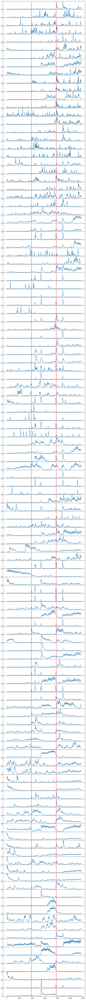

In [31]:
# Plot the individual normalized dF/F traces per plane
plane = 0

plot_temporal(fish, plane, heatmap=False, key='norm_dff')

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that usi

Batch exists. Loading batch.pickle


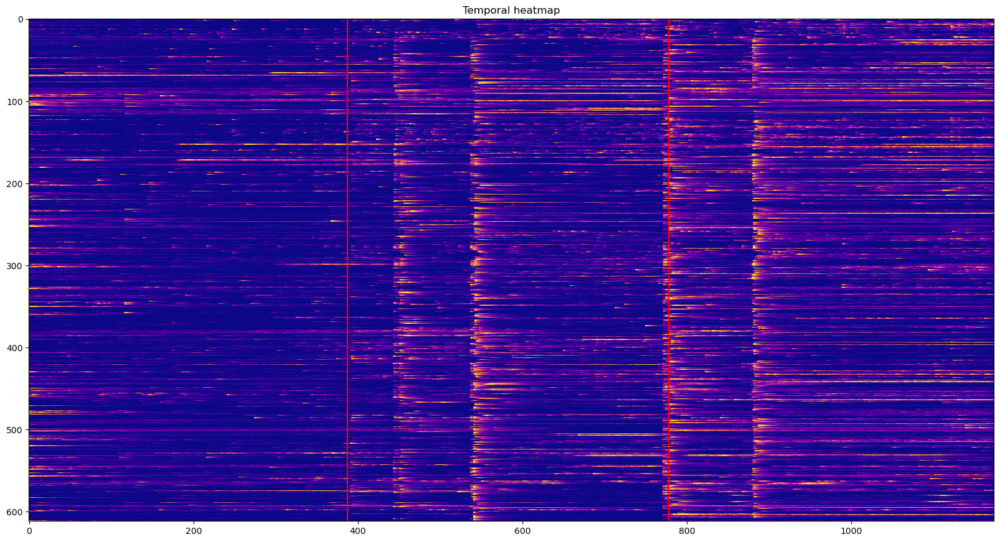

In [42]:
# Plot the individual normalized dF/F traces of the entire volume as a heatmap
plot_temporal_volume(fish, key='norm_dff')

## Cluster temporal responses

In [11]:
fish.vol_temporal.shape  # (# of components, frames)

(612, 1174)

Number of clusters: 10
Batch exists. Loading batch.pickle


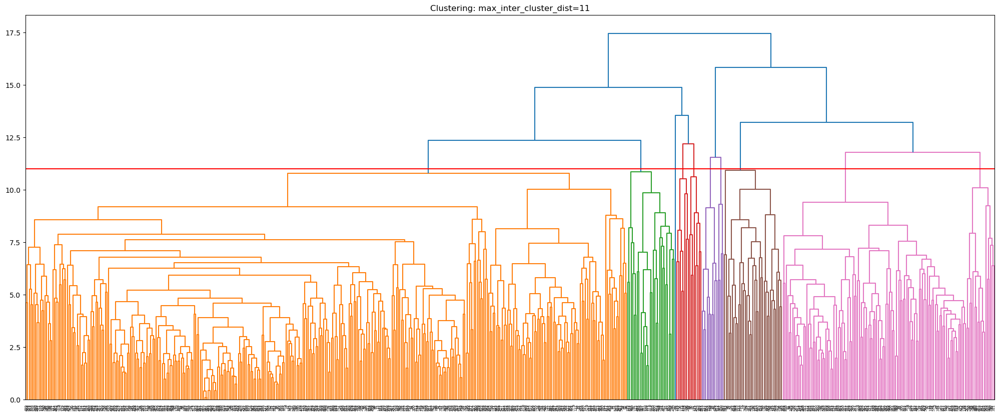

{'max_inter_cluster_dist': 11,
 'sort_inds': array([  0, 321, 537, 318, 316, 315, 313, 312, 310, 309, 308, 307, 539,
        610, 304, 540, 301, 300, 298, 297, 296, 295, 294, 293, 536, 323,
        324, 326, 354, 353, 527, 528, 349, 348, 347, 346, 530, 344, 343,
        541, 342, 340, 339, 337, 335, 334, 333, 332, 331, 330, 533, 534,
        341, 291, 290, 289, 550, 551, 552, 252, 251, 499, 249, 248, 246,
        243, 242, 256, 241, 239, 238, 236, 235, 233, 232, 231, 230, 229,
        228, 225, 240, 355, 257, 259, 288, 287, 286, 285, 284, 542, 282,
        281, 543, 279, 278, 258, 277, 275, 273, 271, 269, 547, 548, 265,
        264, 263, 262, 260, 276, 356, 357, 358, 461, 512, 457, 455, 452,
        451, 517, 448, 447, 446, 445, 462, 444, 441, 439, 438, 518, 436,
        435, 434, 432, 431, 430, 427, 443, 426, 463, 467, 497, 503, 504,
        494, 492, 490, 489, 506, 486, 485, 484, 465, 483, 480, 478, 509,
        476, 475, 474, 473, 510, 470, 469, 468, 481, 559, 425, 423, 385,
       

<Figure size 640x480 with 0 Axes>

In [16]:
# Cluster the temporal responses
max_inter_cluster_dist = 11  # Set the threshold for maximum inter-cluster distance allowed

cluster_temporal(fish, max_inter_cluster_dist, sort=True, savefig=True)

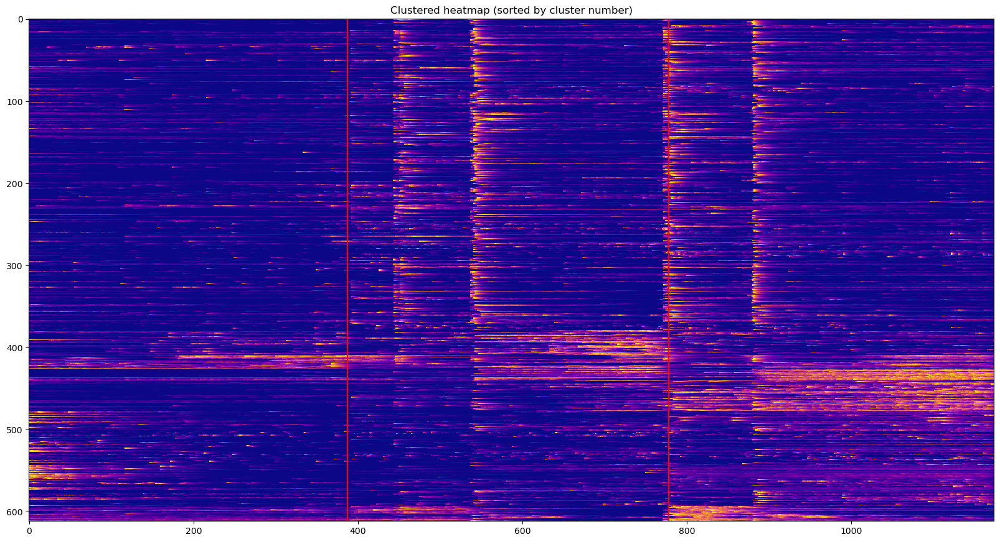

In [19]:
# Heatmap sorted by cluster number
data = fish.vol_temporal[fish.clusters['sort_inds']]
title = 'Clustered heatmap (sorted by cluster number)'
plot_temporal_volume(fish, data=data, title=title)

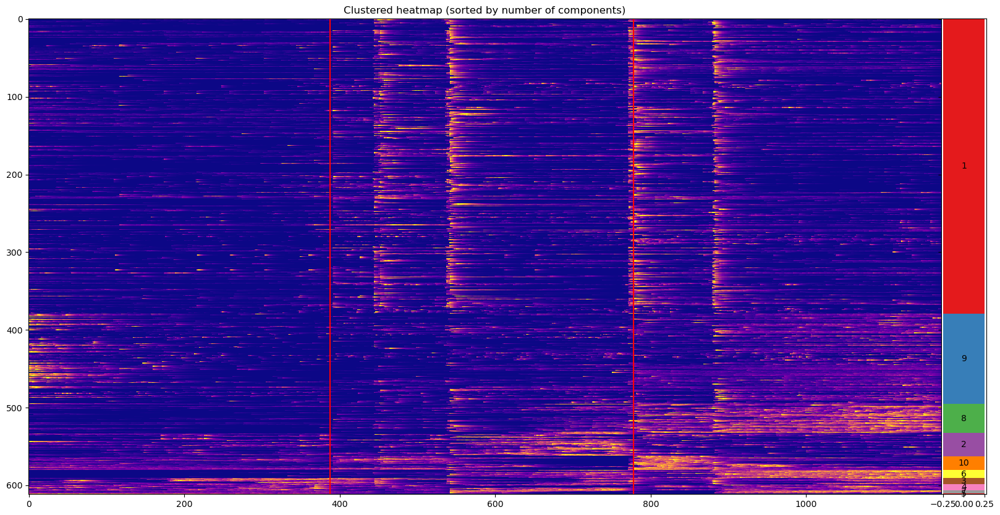

In [20]:
# Heatmap sorted by the number of components in cluster
data = sum(fish.clusters['clusters'].values(), [])
title = 'Clustered heatmap (sorted by number of components)'
plot_temporal_volume(fish, data=data, title=title, clusters=fish.clusters['clusters'])

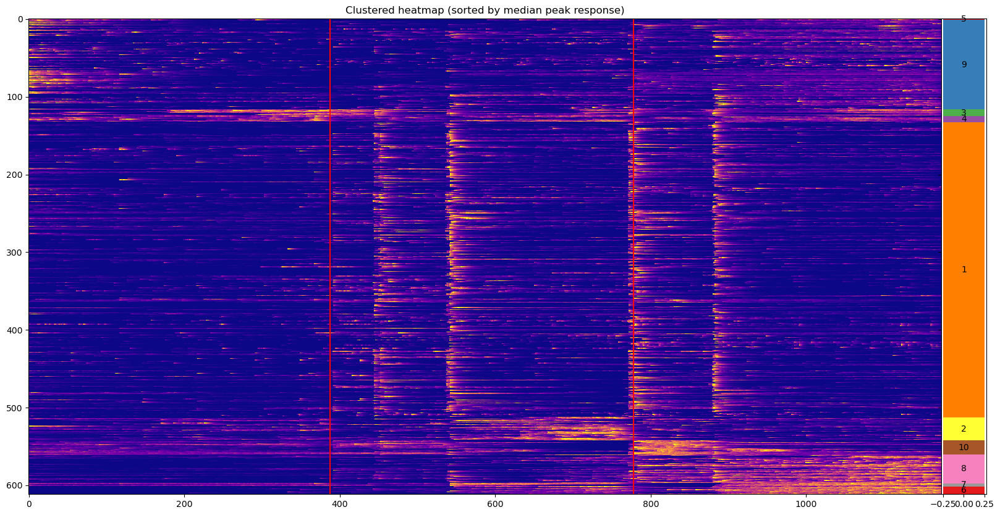

In [21]:
# Heatmap sorted by the median index of maximum peaks in a cluster
data = sum(fish.clusters['peak_clusters'].values(), [])
title = 'Clustered heatmap (sorted by median peak response)'
plot_temporal_volume(fish, data=data, title=title, clusters=fish.clusters['peak_clusters'], savefig=True)

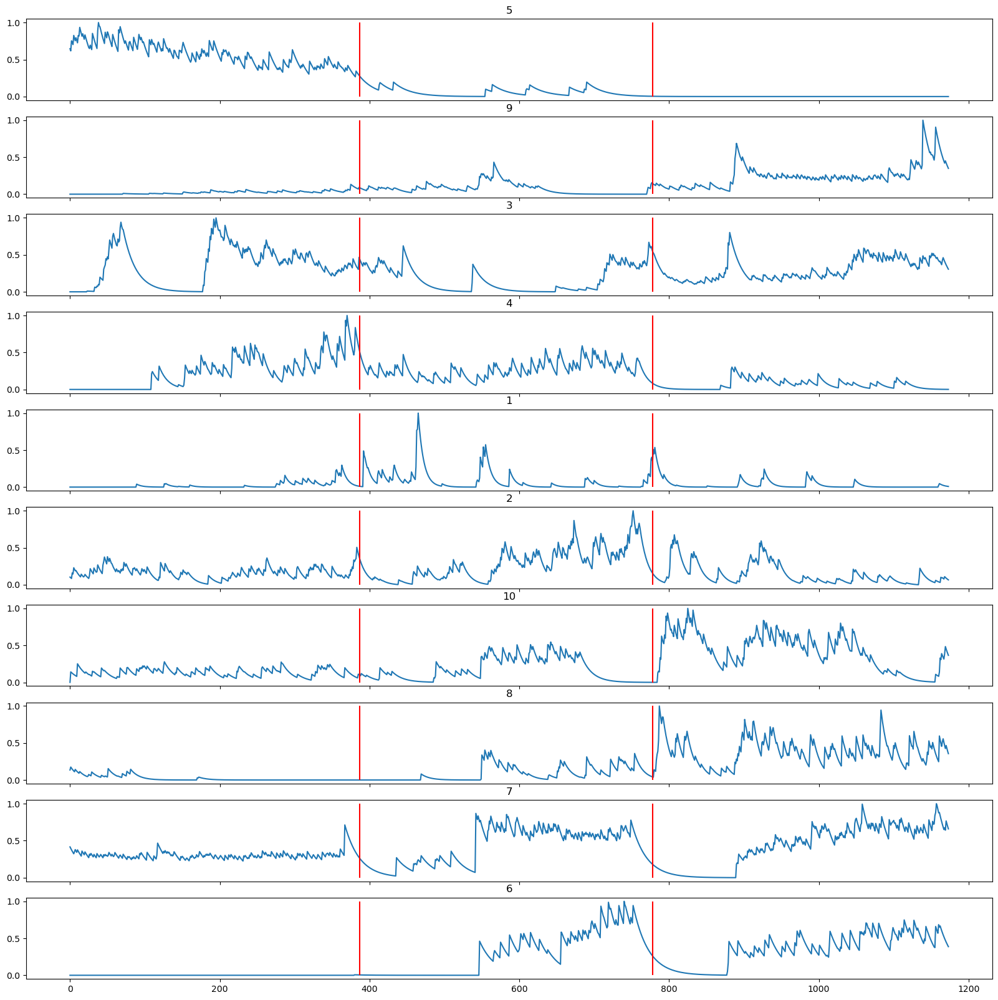

In [22]:
# Plot representative traces from each cluster
plot_representative_trace(fish, fish.clusters['peak_clusters'], savefig=True)

/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


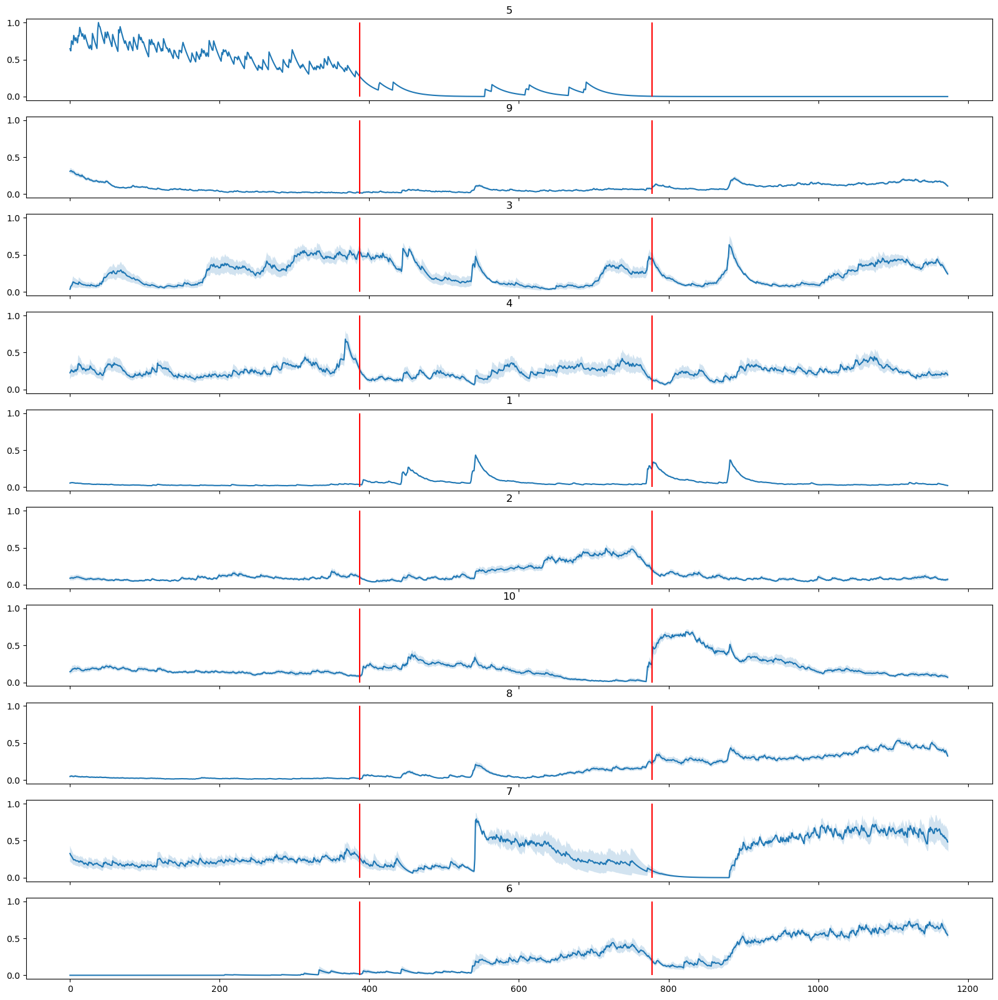

In [23]:
# Plot average traces from each cluster
plot_average_traces(fish, fish.clusters['peak_clusters'], savefig=True)

### Spatial organization of temporal clusters

In [37]:
# Visualize the anatomy stack for spatial representation
# Pick a plane to plot all spatial components on
# Also decide on a vmin-vmax value for visualization
anatomy_img = imread(fish.data_paths['anatomy'])
iw = visualize_images(anatomy_img)
iw.show()

RFBOutputContext()

In [36]:
iw.plot.canvas.close()

In [39]:
# Using the t above, set an index for the background anatomy image
index = 12

# Using the min-max above, set vmin and vmax values for better visualization of the image
vmin = 0
vmax = 76.8

img = anatomy_img[index]

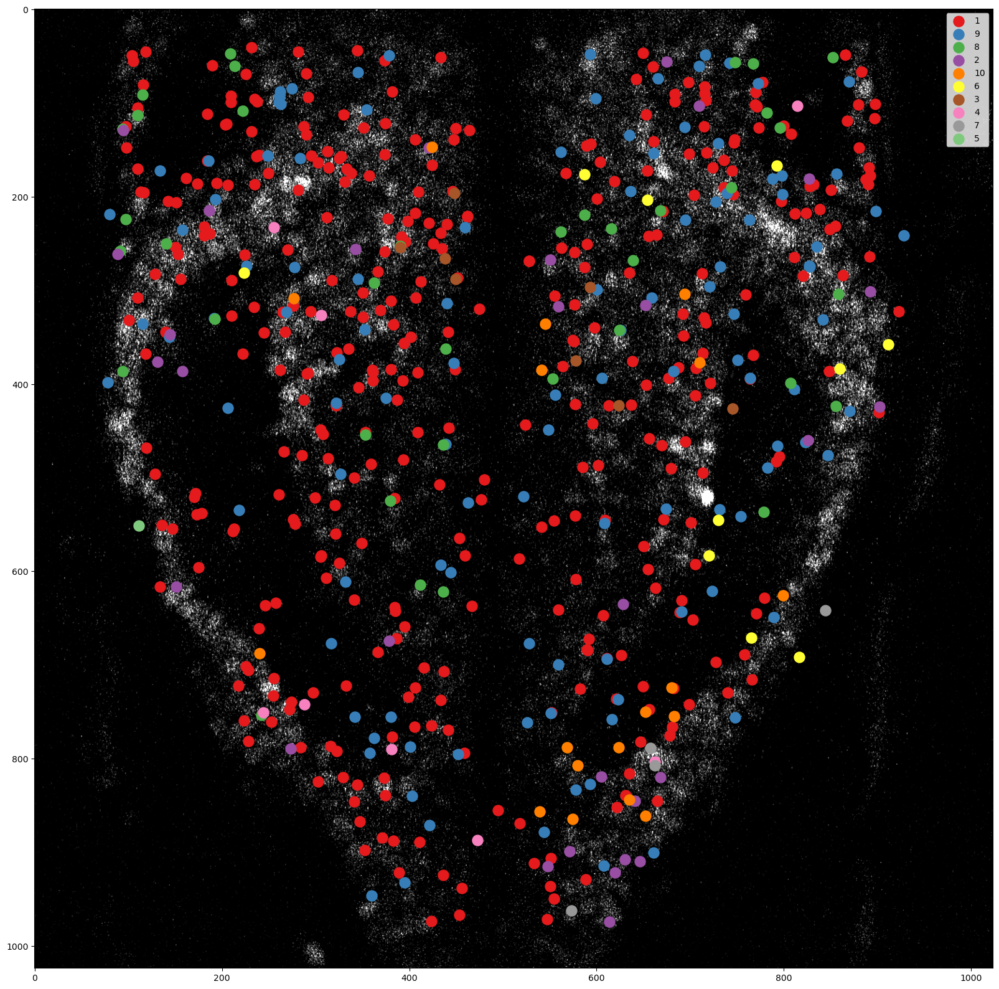

In [45]:
# Plot all components, color coded based on their cluster number
plot_spatial_overlayed(fish, img, vmin=vmin, vmax=vmax, savefig=True)

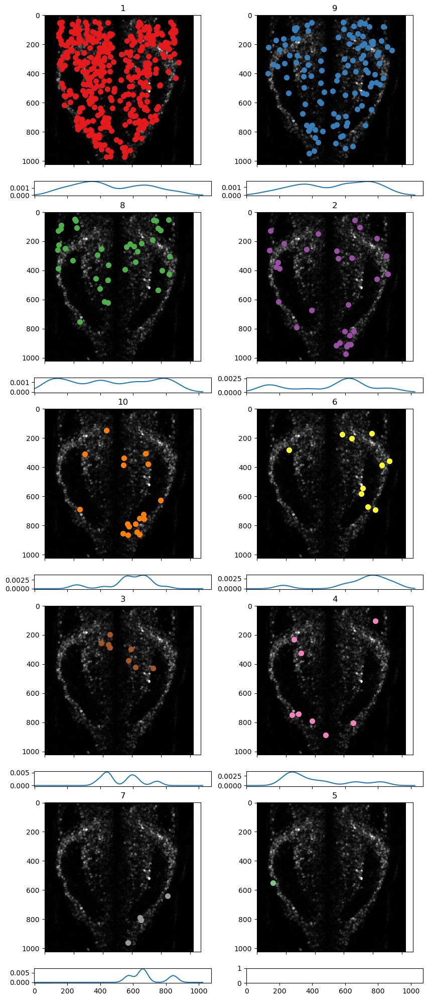

In [57]:
# Plot individual clusters on separately
plot_spatial_individual(fish, img, vmin=vmin, vmax=vmax, distribution=True, savefig=True)